# Allocation of Demand based on Disaggregation and Re-aggregation of Data

This notebook is used to disaggregate demand from the FERC-714 dataset, based on the population from census data, then re-aggregating it to different various geometries like REEDs balancing areas, county-level, or at the state level.

## Datasets and inputs used

1. FERC-714 form: Energy sales timeseries data for every planning area

2. 2010 US Census data: Census tract geometries, and tract-level population and characteristics

3. ReEDs balancing geometries: ReEDs geometries containing county level data

4. US Planning Areas: Contains 97 planning area geometries

## Core functions

1. Function to find intersection of the large and small geometries

2. Function to normalize and redistribute from area to another attribute e.g. population

3. Map functions:

4. Timeseries functions: Functions for allocation

## Disposable parts of analysis

1. Cells doing auxiliary analysis like multiple-counted areas, visualizations for state, county and census tracts 

## Intermediate and Final Datasets

Intermediate datasets are required to limit the number of time-consuming calculations. Primarily, the overlay calculation takes excessive time.

### Intermediate Datasets

Area mapping of planning area with census tracts.

### Final Datasets

ReEDs aggregated demand timeseries data

## Workflow

1. There are generally two geometries: one containing primary smaller non-intersecting geometries like tracts, and the other with larger intersecting geometries

### Disaggregation of data

1. 

### Reaggregation of data

1. 


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
import pathlib
import time
import requests
import json
import datetime
import pickle

import pandas as pd
import numpy as np
import scipy.stats

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import colors
from matplotlib.legend import Legend
import matplotlib.patches as mpatches
import seaborn as sns

import pyproj
from geopandas import gpd
from shapely.geometry import Point
import geopandas
import fiona
from geopandas import GeoDataFrame

import pudl
from pudl.analysis.demand_mapping import (create_intersection_matrix,
                                          create_stacked_intersection_df,
                                          extract_multiple_tracts_demand_ratios,
                                          extract_time_series_demand_multiple_tracts,
                                          matrix_linear_scaling)

from tqdm import tqdm
tqdm.pandas()

/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/tqdm/std.py:668: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.StreamHandler(stream=sys.stdout)
log_format = '%(asctime)s [%(levelname)8s] %(name)s:%(lineno)s %(message)s'
formatter = logging.Formatter(log_format)
handler.setFormatter(formatter)
logger.handlers = [handler]

In [4]:
pudl_settings = pudl.workspace.setup.get_defaults()
data_path = pathlib.Path.cwd().parent / 'data'
pudl_settings

{'pudl_in': '/home/zane/code/catalyst/pudl-work',
 'data_dir': '/home/zane/code/catalyst/pudl-work/data',
 'settings_dir': '/home/zane/code/catalyst/pudl-work/settings',
 'pudl_out': '/home/zane/code/catalyst/pudl-work',
 'sqlite_dir': '/home/zane/code/catalyst/pudl-work/sqlite',
 'parquet_dir': '/home/zane/code/catalyst/pudl-work/parquet',
 'datapkg_dir': '/home/zane/code/catalyst/pudl-work/datapkg',
 'notebook_dir': '/home/zane/code/catalyst/pudl-work/notebook',
 'ferc1_db': 'sqlite:////home/zane/code/catalyst/pudl-work/sqlite/ferc1.sqlite',
 'pudl_db': 'sqlite:////home/zane/code/catalyst/pudl-work/sqlite/pudl.sqlite'}

# Obtain non-PUDL data
Some of the data we're using for this analysis has not yet been fully integrated into PUDL, so we are managing it ad-hoc in a directory at `pudl_settings["data_dir"]/local`

## FERC Form 714
* Download the raw file if we don't have it already.
* Run the draft Extract and Transform steps on it.
* Merge the respondent ID and Planning Area Hourly Demand dataframes.

In [5]:
%%time
def download_zip_url(url, save_path, chunk_size=128):
    r = requests.get(url, stream=True)
    with save_path.open(mode='wb') as fd:
        for chunk in r.iter_content(chunk_size=chunk_size):
            fd.write(chunk)

local_data = pathlib.Path(pudl_settings["data_dir"]) / "local"

ferc714_url = "https://www.ferc.gov/docs-filing/forms/form-714/data/form714-database.zip"
ferc714_dir = local_data / "ferc714"
ferc714_dir.mkdir(parents=True, exist_ok=True)

ferc714_save_path = ferc714_dir / "ferc714.zip"
if ferc714_save_path.exists():
    logger.info("Already have FERC 714 data, not downloading.")
else:
    logger.info("Downloading fresh FERC 714 data.")
    download_zip_url(ferc714_url, ferc714_save_path)

raw_ferc714_dfs = pudl.extract.ferc714.extract(pudl_settings=pudl_settings)
tfr_ferc714_dfs = pudl.transform.ferc714.transform(raw_ferc714_dfs)
pa_demand_ferc714_df = pd.merge(
    tfr_ferc714_dfs["pa_demand_hourly_ferc714"],
    tfr_ferc714_dfs["respondent_id_ferc714"]
)

2020-05-14 19:25:24,411 [    INFO] root:15 Already have FERC 714 data, not downloading.
2020-05-14 19:25:24,412 [    INFO] pudl.extract.ferc714:75 Reading respondent_id_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,420 [    INFO] pudl.extract.ferc714:75 Reading id_certification_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,443 [    INFO] pudl.extract.ferc714:75 Reading ba_gen_plants_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,585 [    INFO] pudl.extract.ferc714:75 Reading ba_demand_monthly_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,611 [    INFO] pudl.extract.ferc714:75 Reading ba_net_energy_load_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,643 [    INFO] pudl.extract.ferc714:75 Reading adjacent_bas_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,729 [    INFO] pudl.extract.ferc714:75 Reading ba_interchange_ferc714 from CSV into pandas DataFrame.
2020-05-14 19:25:24,752 [    INFO] pudl.extract.ferc7

## US Census Tract Geometries and Population
* This US census tract data comes from: https://www.arcgis.com/home/item.html?id=ca1316dba1b442d99cb76bc2436b9fdb
* The 7Zip file from that page must be extracted into the `esri_dir` defined below: `PUDL_IN/data/local/esri`
* The download has to be done by hand because the link is hidden behind some JavaScript nonsense.
* This proprietary dataset will need to be replaced with something open, potentially straight from the US Census.

In [6]:
%%time
esri_dir = local_data / "esri"
esri_dir.mkdir(parents=True, exist_ok=True)
esri_tract_path = esri_dir / "USA_Census_Tract_Boundaries/v10/tracts.gdb"
census_tract_gdf = (
    gpd.read_file(esri_tract_path, driver='FileGDB', layer='tracts')
    # THIS CREATES INVALID FIPS CODES: LEADING ZEROS ARE REQUIRED.
    .assign(STATE_FIPS=lambda x: pd.to_numeric(x.STATE_FIPS))
    # Remove all islands and non-mainland states and territories
    .query("STATE_FIPS<=56 & STATE_FIPS not in (2, 15, 44)")
    # Project to US Albers conic equal-area projection
    .to_crs("ESRI:102003")
)
census_tract_gdf.sample(5)

2020-05-14 19:31:54,982 [ WARNING] fiona._env:294 organizePolygons() received a polygon with more than 100 parts.  The processing may be really slow.  You can skip the processing by setting METHOD=SKIP.
CPU times: user 1min 24s, sys: 934 ms, total: 1min 25s
Wall time: 1min 25s


,STATE_FIPS,CNTY_FIPS,STCOFIPS,TRACT,FIPS,POPULATION,POP_SQMI,POP2010,POP10_SQMI,WHITE,...,FAMILIES,AVE_FAM_SZ,HSE_UNITS,VACANT,OWNER_OCC,RENTER_OCC,SQMI,Shape_Length,Shape_Area,geometry
48932,37,179,37179,020316,37179020316,5549.0,1507.9,4357.0,1184.0,3782.0,...,1221.0,3.27,1525.0,66.0,1279.0,180.0,3.68,0.156227,0.000942,"MULTIPOLYGON (((1380824.590 -161062.645, 13808..."
35607,26,077,26077,000900,26077000900,1330.0,1136.8,1296.0,1107.7,660.0,...,271.0,3.56,516.0,76.0,225.0,215.0,1.17,0.118243,0.000331,"MULTIPOLYGON (((853197.513 583711.979, 853215...."
70120,9,001,09001,110301,09001110301,6278.0,1561.7,6174.0,1535.8,5529.0,...,1718.0,2.79,2936.0,180.0,2250.0,506.0,4.02,0.166801,0.001121,"MULTIPOLYGON (((1883878.479 655994.342, 188390..."
30481,18,147,18147,952900,18147952900,2616.0,32.4,2666.0,33.0,2611.0,...,783.0,2.93,1183.0,119.0,898.0,166.0,80.67,0.949647,0.021434,"MULTIPOLYGON (((774009.390 103942.779, 773983...."
26708,47,065,47065,011446,47065011446,4007.0,1757.5,3194.0,1400.9,2458.0,...,895.0,2.76,1541.0,92.0,902.0,547.0,2.28,0.146844,0.000584,"MULTIPOLYGON (((978464.644 -222730.188, 978447..."


## Electricity Planning Area Geometries:
* For now planning areas come from this DHS open dataset: https://hifld-geoplatform.opendata.arcgis.com/datasets/electric-planning-areas

In [7]:
import zipfile
hifld_pa_url = "https://opendata.arcgis.com/datasets/7d35521e3b2c48ab8048330e14a4d2d1_0.gdb"
hifld_dir = local_data / "hifld"
hifld_dir.mkdir(parents=True, exist_ok=True)
hifld_pa_zipfile = hifld_dir / "electric_planning_areas.gdb.zip"
hifld_pa_gdb_dir = hifld_dir / "electric_planning_areas.gdb"
if not hifld_pa_gdb_dir.is_dir():
    logger.info("No Planning Area GeoDB found. Downloading from HIFLD.")
    # Download to appropriate location
    download_zip_url(hifld_pa_url, hifld_pa_zipfile)
    # Unzip because we can't use zipfile paths with geopandas
    with zipfile.ZipFile(hifld_pa_zipfile, 'r') as zip_ref:
        zip_ref.extractall(hifld_dir)
        # Grab the UUID based directory name so we can change it:
        extract_root = hifld_dir / pathlib.Path(zip_ref.filelist[0].filename).parent
    extract_root.rename(hifld_pa_gdb_dir)
else:
    logger.info("We've already got the planning area GeoDB.")

logger.info("Extracting the GeoDB into a GeoDataFrame")
epas_gdf = pudl.transform.ferc714.electricity_planning_areas(pudl_settings)
logger.info("Dropping Planning Areas in AK and HI.")
# * 3522 = Chugach Electric Association (AK)
# * 19547 = Hawaii Electric Co 
logger.info("Reprojecting to US Albers Conic Equal Area projection.")
ak_hi_planning_area_ids = [3522, 19547]
epas_gdf = (
    epas_gdf.query("ID not in @ak_hi_planning_area_ids")
    # Project to US Albers conic equal-area projection
    .to_crs("ESRI:102003")
)

2020-05-14 19:33:20,213 [    INFO] root:18 We've already got the planning area GeoDB.
2020-05-14 19:33:20,213 [    INFO] root:20 Extracting the GeoDB into a GeoDataFrame
2020-05-14 19:33:22,660 [    INFO] root:22 Dropping Planning Areas in AK and HI.
2020-05-14 19:33:22,661 [    INFO] root:25 Reprojecting to US Albers Conic Equal Area projection.


In [8]:
pa_demand_2018 = pa_demand_ferc714_df.query("report_year==2018")

## merging 2018 demand data with gdf_planning_areas
ferc_demand_sum = (
    pa_demand_2018
    .groupby("utility_id_eia")[["demand_mwh"]]
    .sum()
    .reset_index()
#    .rename(columns={"demand_mwh": "demand_mwh_2018"})
)

pd.set_option("max_rows", 200)

display(
    epas_gdf[["ID", "NAME"]]
    .drop_duplicates()
    .merge(
        pa_demand_2018[["utility_name_ferc714", "utility_id_eia"]].drop_duplicates(),
        how="outer", left_on="ID", right_on="utility_id_eia"
    )
)

pd.reset_option("max_rows")

epas_gdf = (
    epas_gdf
    .merge(ferc_demand_sum, how="inner", left_on="ID", right_on="utility_id_eia")
    .drop("utility_id_eia", axis=1)
)

,ID,NAME,utility_name_ferc714,utility_id_eia
0,195,ALABAMA POWER COMPANY,Alabama Power Company,195
1,796,"ARIZONA ELECTRIC POWER COOPERATIVE, INC.","Arizona Electric Power Cooperative, Inc.",796
2,1307,BASIN ELECTRIC POWER COOP,Basin Electric Power Cooperative,1307
3,2507,CITY OF BURBANK,City of Burbank,2507
4,3408,ELECTRIC POWER BOARD OF CHATTANOOGA,Electric Power Board of Chattanooga,3408
5,3989,COLORADO SPRINGS UTILITIES,Colorado Springs Utilities,3989
6,4922,DAYTON POWER & LIGHT CO,"Dayton Power & Light Company, The",4922
7,4958,DECATUR UTILITIES,Decatur Utilities,4958
8,6022,EUGENE WATER & ELECTRIC BOARD,Eugene Water & Electric Board,6022
9,6567,FLORIDA MUNICIPAL POWER AGENCY,Florida Municipal Power Agency,6567


## Finding intersection area of each census tract with each planning area for demand allocation 

In [9]:
%%time
tracts_pa_ratios_stacked_pickle = pathlib.Path.cwd() / "tracts_planning_area_ratios_stacked.pkl"
if tracts_pa_ratios_stacked_pickle.is_file():
    logging.info("Found pre-existing intersection file.")
    with tracts_pa_ratios_stacked_pickle.open(mode="rb") as f:
        gdf_intersection = pickle.load(f)
else:
    start_time = time.time()
    gdf_intersection = create_stacked_intersection_df(census_tract_gdf, epas_gdf)
    print("--- %s seconds ---" % (time.time() - start_time))
    with tracts_pa_ratios_stacked_pickle.open(mode="wb") as f:
        pickle.dump(gdf_intersection, f)

2020-05-14 19:33:29,431 [    INFO] root:3 Found pre-existing intersection file.
CPU times: user 13.8 ms, sys: 0 ns, total: 13.8 ms
Wall time: 17.9 ms


## Pivoting the mapping to a matrix, and scaling/normalization by individual population, then finding allocating demand accordingly

In [10]:
%%time
intersection_matrix = create_intersection_matrix(gdf_intersection)
pop_norm_matrix = matrix_linear_scaling(intersection_matrix, gdf_scale=census_tract_gdf)
demand_norm_matrix = matrix_linear_scaling(
    pop_norm_matrix, gdf_scale=epas_gdf,
    gdf_scale_col="demand_mwh", axis_scale=0
)

CPU times: user 1.17 s, sys: 67.9 ms, total: 1.24 s
Wall time: 1.24 s


In [11]:
# Areas in demand dataframe that do not have a shape geometry
(
    ferc_demand_sum[~ferc_demand_sum["utility_id_eia"].isin(pop_norm_matrix.columns)]
     .merge(pa_demand_2018[["utility_id_eia", "utility_name_ferc714"]])
     .drop_duplicates()
)

,utility_id_eia,demand_mwh,utility_name_ferc714
0,3522,1258622.00,"Chugach Electric Association, Inc."
8760,13100,11132980.00,Municipal Electric Authority of Georgia
17520,13670,3365884.00,Northeast Texas Electric Cooperative
26280,17867,807656.00,City of St. Cloud
35040,19547,7002252.63,"Hawaiian Electric Company, Inc"


## Grouping demand data at the county and state level

In [12]:
census_tract_gdf = (
    census_tract_gdf.merge(
        demand_norm_matrix
        .sum(axis=1)
        .reset_index()
        .rename(columns={0: "demand_mwh"})
    )
)

## Created tracts demand aggregated by state
county_gdf = (
    census_tract_gdf[["STCOFIPS", "geometry"]]
    .merge(
        census_tract_gdf
        .groupby("STCOFIPS")[["demand_mwh", "SQMI", "POPULATION"]]
        .sum()
        .reset_index()
    )
)

county_gdf["energy_demand_per_sqmi"] = county_gdf["demand_mwh"] / county_gdf["SQMI"]
county_gdf["demand_per_capita"] = county_gdf["demand_mwh"] / county_gdf["POPULATION"]

## Created tracts demand aggregated by state
state_gdf = (
    census_tract_gdf[["STATE_FIPS", "geometry"]]
    .merge(
        census_tract_gdf
        .groupby("STATE_FIPS")[["demand_mwh", "SQMI", "POPULATION"]]
        .sum()
        .reset_index()
    )
)

state_gdf["energy_demand_per_sqmi"] = state_gdf["demand_mwh"] / state_gdf["SQMI"]

state_gdf["demand_per_capita"] = state_gdf["demand_mwh"] / state_gdf["POPULATION"]

## Incorporating state annual sales for residential, industrial comparison

In [13]:
sales_df = pd.read_excel("https://www.eia.gov/electricity/data/state/sales_annual.xlsx", skiprows=[0])
sales_df = sales_df[sales_df["Year"]==2018]
sales_df = sales_df[~sales_df["State"].isin(["US", "HI", "AK", "DC"])]
# print(sales_df["Industry Sector Category"].unique())
sales_df = sales_df[sales_df["Industry Sector Category"]=="Total Electric Industry"]

states_fips_lookup = pd.read_html("https://www.nrcs.usda.gov/wps/portal/nrcs/detail/?cid=nrcs143_013696")[0].iloc[:-1]
states_fips_lookup = states_fips_lookup.astype({
    "FIPS": "int32"
})

# states_fips_lookup["FIPS"] = states_fips_lookup["FIPS"].apply(lambda x: int(x))

sales_df = sales_df.merge(states_fips_lookup, left_on="State",
                          right_on="Postal Code")[["State", "Total", "FIPS",
                                                   "Residential", "Commercial", "Industrial"]]

sales_df = (state_gdf[["STATE_FIPS", "demand_mwh"]]
            .drop_duplicates()
            .reset_index(drop=True)
            .merge(sales_df, left_on="STATE_FIPS", right_on="FIPS")).drop("FIPS", axis=1)

sales_df = sales_df.sort_values("demand_mwh", ascending=False).reset_index(drop=True)

sales_df["pc_error"] = abs(sales_df["Total"] - sales_df["demand_mwh"]) / sales_df["Total"]


sales_df = sales_df.sort_values("pc_error", ascending=False).reset_index(drop=True)
sales_sum = sales_df["Total"].sum()
allocated_demand_sum = sales_df["demand_mwh"].sum()

sales_df["adjusted_demand"] = sales_df["demand_mwh"] * sales_sum / allocated_demand_sum

sales_df.head()

,STATE_FIPS,demand_mwh,State,Total,Residential,Commercial,Industrial,pc_error,adjusted_demand
0,31,5.442649e+07,NE,30939492,10412008,9553396,10974088,0.759127,4.896156e+07
1,46,2.134579e+07,SD,12856938,5018360,4903243,2935335,0.660255,1.920247e+07
2,20,6.637959e+07,KS,42036979,14187192,16168750,11681037,0.579076,5.971445e+07
3,30,2.266471e+07,MT,14838845,5197686,4921231,4719928,0.527391,2.038896e+07
4,34,1.153194e+08,NJ,76016762,29530689,38807065,7369106,0.517027,1.037403e+08


## Allocating demand time series at the state level

In [14]:
dict_state_tracts = (
    census_tract_gdf
    .groupby("STATE_FIPS")
    .agg({"FIPS": list})
    .to_dict()["FIPS"]
)

dict_statefips_names = (
    states_fips_lookup
    .set_index("FIPS")["Name"]
    .to_dict()
)

dict_statefips_names[11] = "DC"
display(pa_demand_2018.head())
display(pop_norm_matrix.head())

,report_year,utility_id_ferc714,utc_datetime,timezone,demand_mwh,utility_name_ferc714,utility_id_eia
105192,2018,101,2018-01-01 06:00:00,America/Chicago,1565.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105193,2018,101,2018-01-01 07:00:00,America/Chicago,1602.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105194,2018,101,2018-01-01 08:00:00,America/Chicago,1648.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105195,2018,101,2018-01-01 09:00:00,America/Chicago,1702.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105196,2018,101,2018-01-01 10:00:00,America/Chicago,1774.0,PowerSouth Energy Cooperative (Alabama Electri...,189


ID,189,195,229,796,803,924,1307,1738,2507,3046,...,21554,24211,25471,28503,30151,39347,40211,40218,40233,56669
FIPS,,,,,,,,,,,,,,,,,,,,,
01001020100,899.5,899.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020200,1032.0,1032.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020300,1739.0,1739.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020400,2132.0,2132.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020500,5675.5,5675.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# Utilities that show up in the normalization matrix, but not in the time series:
missing_utils = set(pop_norm_matrix.columns).difference(set(pa_demand_2018.utility_id_eia))

df_state_sales = []
for state_tracts in tqdm(dict_state_tracts.values()):
    df_state_sales.append(
        extract_time_series_demand_multiple_tracts(
            demand_df=pa_demand_2018,
            demand_id_col="utility_id_eia",
            demand_col="demand_mwh",
            time_col="utc_datetime",
            normed_weights=pop_norm_matrix.drop(missing_utils, axis=1),
            target_ids=state_tracts,
        )
    )
    
df_state_sales = pd.concat(
    df_state_sales,
    axis=1,
    keys=[dict_statefips_names[key] + "_Sales" for key in dict_state_tracts.keys()]
)

100%|██████████| 48/48 [00:08<00:00,  5.41it/s]


In [16]:
df_state_sales_monthly = df_state_sales.groupby(pd.Grouper(freq="M")).sum()

df_state_sales_2018 = df_state_sales_monthly[(df_state_sales_monthly.index >= "2018-01-01") &
                       (df_state_sales_monthly.index <= "2018-12-31")].stack().reset_index().rename(columns={"level_1": "State", 0: "GWh_allocated"})

df_state_sales_2018["GWh_allocated"] = df_state_sales_2018["GWh_allocated"] / 1000

df_state_sales_2018["utc_datetime"] = (df_state_sales_2018["utc_datetime"].dt.year * 100 +
                                     df_state_sales_2018["utc_datetime"].dt.month)

df_state_sales_2018["State"] = df_state_sales_2018["State"].str.rstrip('Sales').str.rstrip('_').str.strip()

In [17]:
df_state_sales

,Alabama_Sales,Arizona_Sales,Arkansas_Sales,California_Sales,Colorado_Sales,Connecticut_Sales,Delaware_Sales,DC_Sales,Florida_Sales,Georgia_Sales,...,South Dakota_Sales,Tennessee_Sales,Texas_Sales,Utah_Sales,Vermont_Sales,Virginia_Sales,Washington_Sales,West Virginia_Sales,Wisconsin_Sales,Wyoming_Sales
utc_datetime,,,,,,,,,,,,,,,,,,,,,
2018-01-01 05:00:00,303.777582,NaN,5100.452004,NaN,NaN,4357.788830,1746.866032,1217.057628,18953.655711,61.506780,...,452.911155,1346.038907,7846.397207,NaN,772.220874,15036.895053,NaN,3351.368279,8152.360904,14.514608
2018-01-01 06:00:00,14282.485235,31.285927,6817.115971,90.270399,3.759089,4229.765538,1731.635715,1206.446526,19750.056931,16676.848223,...,2171.257363,21352.448676,63285.961233,1.533290,749.534529,15085.392244,NaN,3322.150698,8929.261178,399.268857
2018-01-01 07:00:00,14452.546316,6752.175898,6766.994806,95.287476,9666.274090,4151.512006,1717.525503,1196.615812,19004.226411,16885.065918,...,2774.011245,21524.033937,63843.427804,93.588577,735.667709,14965.741603,0.000527,3295.084196,8850.003277,1155.791413
2018-01-01 08:00:00,14597.552587,7002.296711,6745.270389,28136.705451,9433.782590,4118.601309,1718.521152,1197.309490,18635.646140,16909.662733,...,2757.328607,21616.898263,63873.571882,4126.448194,729.835987,14975.247983,11481.432444,3296.995593,8808.252618,1406.853006
2018-01-01 09:00:00,14823.805272,6913.028794,6758.886523,27028.068452,9307.457988,4137.942464,1734.233736,1208.256592,18748.172772,17261.639007,...,2758.603735,21832.493428,64202.587530,4068.327090,733.263787,15112.522649,11297.261137,3327.132974,8818.454937,1401.412370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-01 03:00:00,8553.868745,9623.087450,5574.213757,35819.477445,11440.905808,3575.556884,1226.857269,854.762741,23294.604789,11649.952420,...,2516.700256,12181.166798,49592.826380,5086.752085,633.605069,10659.472737,13572.985200,2353.627022,7349.893806,1492.991458
2019-01-01 04:00:00,8270.529643,9366.321229,5423.811291,34627.088919,11052.447794,3392.231441,1171.832109,816.426206,21656.493247,11051.603647,...,2476.852403,11736.068724,48637.831071,4953.840329,601.118930,10182.261942,13174.888608,2248.064791,7113.831391,1451.027939
2019-01-01 05:00:00,7695.127052,9015.016698,1481.119223,33296.525256,10689.578878,NaN,NaN,NaN,1097.016675,10473.395431,...,2106.845158,10612.367586,42065.293450,4788.691278,NaN,92.044921,12721.103730,NaN,825.722903,1413.426444


## Extracting state sales from EIA

In [18]:
sales_data = (json.loads(requests
                         .get("http://api.eia.gov/category/?api_key=d2b250683a925a1bddcd63c5d12698c0&category_id=38")
                         .text))

sales_data_urls = [a["series_id"]
                   for a in sales_data["category"]["childseries"]
                   if a["series_id"][-1] == "M"]

sales_data_states_names = [a["name"][30:-23]
                           for a in sales_data["category"]["childseries"]
                           if a["series_id"][-1] == "M"]


df_sales_eia = []

for index in tqdm(range(len(sales_data_urls))):
    df_sales_eia.append(pd.DataFrame((json.loads(requests
            .get("http://api.eia.gov/series/?api_key=d2b250683a925a1bddcd63c5d12698c0&series_id=" +
                 sales_data_urls[index])
            .text))["series"][0]["data"])
                        .rename(columns={0: "utc_datetime", 1: sales_data_states_names[index]})
                        .set_index("utc_datetime"))
    
    
df_sales_eia = pd.concat(df_sales_eia, axis=1).reset_index()
df_sales_eia["utc_datetime"] = pd.to_numeric(df_sales_eia["utc_datetime"])


df_sales_eia_2018 = df_sales_eia[df_sales_eia["utc_datetime"] // 100 == 2018]
df_sales_eia_2018 = df_sales_eia_2018.set_index("utc_datetime").stack().reset_index().rename(columns={"level_1": "State", 0: "GWh"})
df_sales_eia_2018["State"] = df_sales_eia_2018["State"].str.strip()


## Scaling Demand Time Series by a constant factor to make the total sums equal
df_check = df_state_sales_2018.merge(df_sales_eia_2018, how="inner")

df_check["GWh_adjusted"] = df_check["GWh_allocated"] * df_check["GWh"].sum() / df_check["GWh_allocated"].sum()

100%|██████████| 62/62 [00:27<00:00,  2.22it/s]


## Extracting 2018 REEDS data

In [19]:
%%time
reeds_path = local_data / "nrel/reeds"
if not reeds_path.is_dir():
    raise FileNotFoundError(
        f"ReEDS Balancing Area gemoetries not found."
        f"Expected them at {reeds_path}"
    )
reeds_gdf = gpd.read_file(reeds_path)
reeds_gdf = (
    reeds_gdf.assign(pca_num=lambda x: pd.to_numeric(x.pca.replace("^p", value="", regex=True)))
    .query("pca_num<=134")
    .to_crs("ESRI:102003")
)
reeds_gdf.sample(10)

CPU times: user 5.75 s, sys: 32.6 ms, total: 5.78 s
Wall time: 5.86 s


,OBJECTID,gid,demreg2,pca,Shape_Leng,Shape_Area,geometry,pca_num
80,81,81.0,36.0,p12,12.376447,7.190207,"POLYGON ((-1496480.750 534677.604, -1499161.71...",12
52,53,53.0,8.0,p3,10.683118,4.875915,"POLYGON ((-1561724.397 1456783.823, -1561347.6...",3
368,369,369.0,324.0,p122,3.053525,0.494808,"POLYGON ((1664107.817 642321.190, 1664196.051 ...",122
122,123,123.0,78.0,p34,10.534245,3.970761,"POLYGON ((-880615.598 -10146.868, -881310.229 ...",34
295,296,296.0,251.0,p115,2.980233,0.327291,"POLYGON ((1308691.110 441616.645, 1308636.352 ...",115
387,388,388.0,343.0,p132,5.066974,0.739086,"POLYGON ((1942292.957 716230.058, 1942285.800 ...",132
112,113,113.0,68.0,p19,11.034163,3.083553,"POLYGON ((-749218.298 1321355.647, -748759.408...",19
258,259,259.0,214.0,p103,11.627829,3.113210,"MULTIPOLYGON (((815938.160 970043.271, 815802....",103
349,350,350.0,305.0,p99,18.600723,0.793142,"MULTIPOLYGON (((1681069.111 136087.962, 168100...",99
134,135,135.0,90.0,p31,12.970028,8.010720,"POLYGON ((-1067846.521 -575247.029, -1070110.2...",31


In [20]:
%%time

# The pickled intersection geometries should be here in this directory:
pickled_reeds_path = pathlib.Path.cwd() / "tracts_reeds_areas_ratios_stacked.pkl"

# If we don't have the saved intersection geometry we need to regenerate it:
if not pickled_reeds_path.is_file():
    logger.info("No precomputed Census tract / REeDS BA intersections found. Creating them.")
    reeds_intersection_gdf = create_stacked_intersection_df(census_tract_gdf, reeds_gdf, gdf_secondary_col="OBJECTID")
    pickle.dump(reeds_intersection_gdf, pickled_reeds_path.open(mode="wb"))

# At this point we should definitely have the intersection file available:
with pickled_reeds_path.open(mode="rb") as f:
    logger.info("Reading pre-computed Census tract / REeDS BA intersections.")
    reeds_intersection_gdf = pickle.load(f)

2020-05-14 19:34:22,387 [    INFO] root:12 Reading pre-computed Census tract / REeDS BA intersections.
CPU times: user 17.8 ms, sys: 88 µs, total: 17.9 ms
Wall time: 17.5 ms


In [22]:
reeds_intersection_gdf.columns

Index(['FIPS', 'OBJECTID', 'gdf_intermediate_intersection_fraction',
       'gdf_source_intersection_fraction'],
      dtype='object')

In [24]:
reeds_intersection_matrix = create_intersection_matrix(reeds_intersection_gdf,
                                                       gdf_source_col="OBJECTID",
                                                       gdf_intersection_col='gdf_source_intersection_fraction')

pop_norm_reeds = matrix_linear_scaling(reeds_intersection_matrix, census_tract_gdf)

reeds_demand_2018 = matrix_linear_scaling(pop_norm_reeds,
                                          gdf_scale=census_tract_gdf,
                                          gdf_scale_col="demand_mwh",
                                          axis_scale=1)

reeds_gdf = (
    reeds_gdf.set_index("OBJECTID")
    .assign(demand_mwh=reeds_demand_2018.sum(axis=0))
    .reset_index()
)

# Aggregate REEDS data at PCA level
reeds_pca = (
    reeds_gdf
    .drop("demand_mwh", axis=1)
    .merge(
        reeds_gdf
        .groupby("pca_num")["demand_mwh"]
        .sum().reset_index()
    )
)

## Mapping from Census-Planning Areas & Census-REEDS to REEDS-Planning Areas

In [25]:
drop_fips = (set(pop_norm_reeds[pop_norm_reeds.sum(axis=1) == 0].index)
             .union(set(pop_norm_matrix[pop_norm_matrix.sum(axis=1) == 0].index)))

common_fips = (set(pop_norm_matrix.index)
               .intersection(set(pop_norm_reeds.index))
               .difference(drop_fips))

pop_ferc_reeds= (pop_norm_reeds
                 .loc[common_fips].T
                 .divide(pop_norm_reeds.loc[common_fips]
                         .sum(axis=1))) @ pop_norm_matrix.loc[common_fips]

## Mapping FERC714 demand time series to pca areas

In [26]:
# Utilities that show up in normalization matrix but not in the time series
missing_utils = set(pop_ferc_reeds.columns).difference(set(pa_demand_2018.utility_id_eia))

dict_reeds_tracts = reeds_gdf.groupby("pca").agg({"OBJECTID": list}).to_dict()["OBJECTID"]

df_reeds_sales = []
for objectids in tqdm(dict_reeds_tracts.values()):
    df_reeds_sales.append(
        extract_time_series_demand_multiple_tracts(
            demand_df=pa_demand_2018,
            demand_id_col="utility_id_eia",
            demand_col="demand_mwh",
            time_col="utc_datetime",
            normed_weights=pop_ferc_reeds.drop(missing_utils, axis=1),
            target_ids=objectids,
        )
    )
    
df_reeds_sales = pd.concat(df_reeds_sales, axis=1, keys=dict_reeds_tracts.keys())
df_reeds_sales_monthly = df_reeds_sales.groupby(pd.Grouper(freq="M")).sum() 

100%|██████████| 134/134 [00:16<00:00,  8.04it/s]


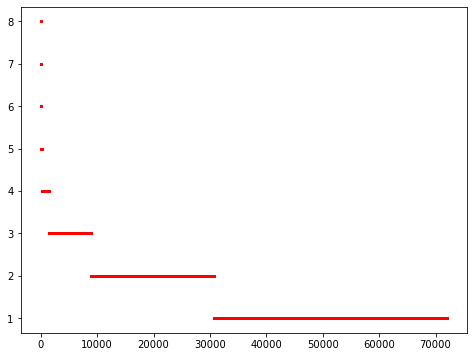

In [27]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot((intersection_matrix != 0)
         .sum(axis=1)
         .sort_values(ascending=False)
         .tolist(), 'ro', ms=2)

plt.show()

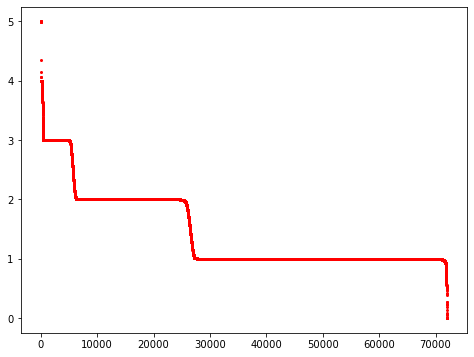

In [28]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(create_intersection_matrix(gdf_intersection, normalization=0)
         .sum(axis=1)
         .sort_values(ascending=False)
         .tolist(), 'ro', ms=2)

plt.show()

/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/pysal/explore/segregation/network/network.py:15: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  warn(
/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


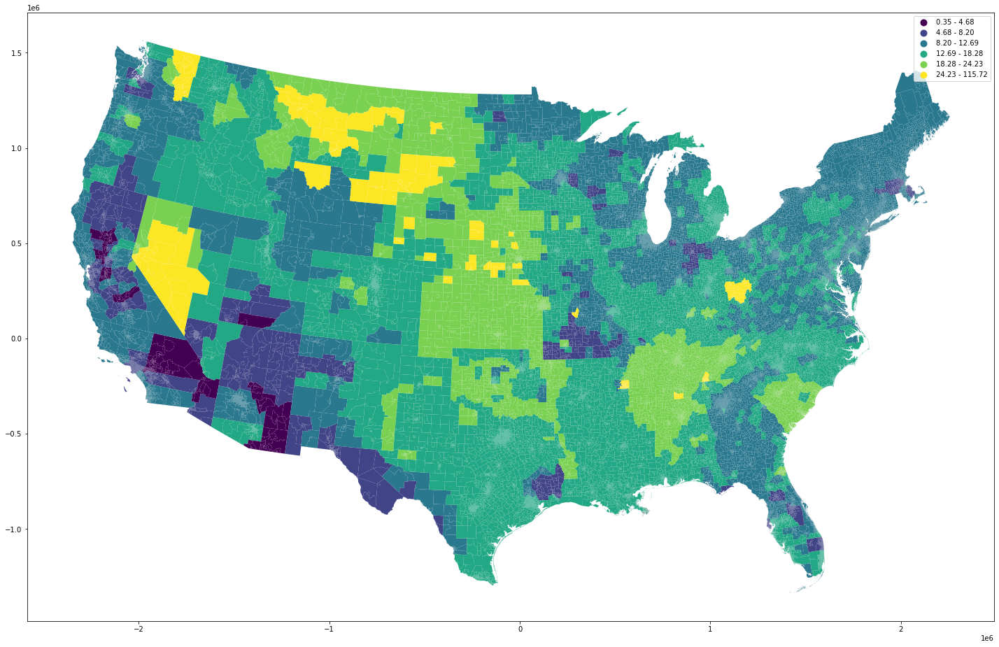

In [29]:
# County level electricity demand per capita
fig, ax = plt.subplots(figsize=(28, 16))
county_gdf.plot(
    column="demand_per_capita",
    ax=ax,
    legend=True,
    scheme="percentiles",
)
plt.show()

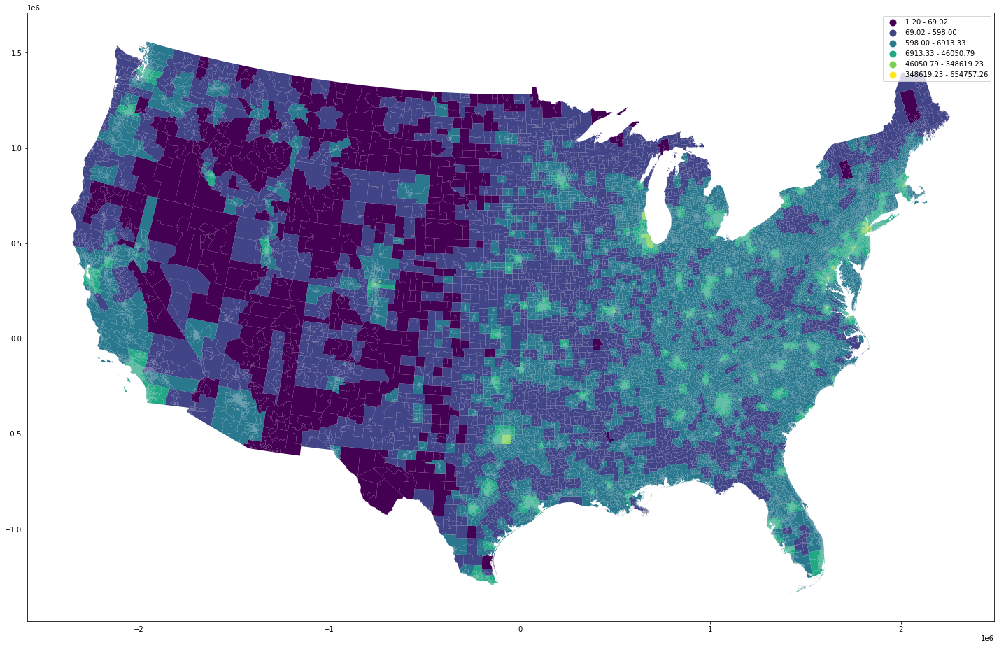

In [30]:
# County demand per unit area
fig, ax = plt.subplots(figsize=(28, 16))
county_gdf.plot(
    column="energy_demand_per_sqmi",
    ax=ax,
    legend=True,
    scheme="percentiles",
    linewidth=0,
)
plt.show()

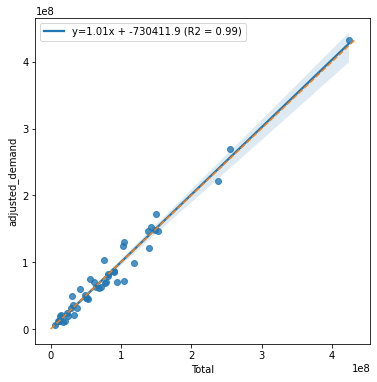

In [31]:
pred = 'adjusted_demand'
actual = "Total"


fig, ax = plt.subplots(figsize=(6, 6))

def r2(x, y):
    
    return scipy.stats.pearsonr(sales_df[actual], sales_df[pred])


slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(sales_df[actual], sales_df[pred])

sns.regplot(x=actual, y=pred, data=sales_df, ax = ax,
            line_kws={'label':"y={0:.2f}x + {1:.1f} (R2 = {2:.2f})".format(slope,intercept,r_value)})


min_lim, max_lim = 0, sales_df[[actual, pred]].max().max()


ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")

# ax = sns.jointplot(x="Residential", y="Demand", data=sales_df, stats_func=r2)


ax.legend()
plt.show()

## Comparison with monthly data using EIA 



In [32]:
df_check["GWh_allocated"].sum() / df_check["GWh"].sum()

1.1109271244712868

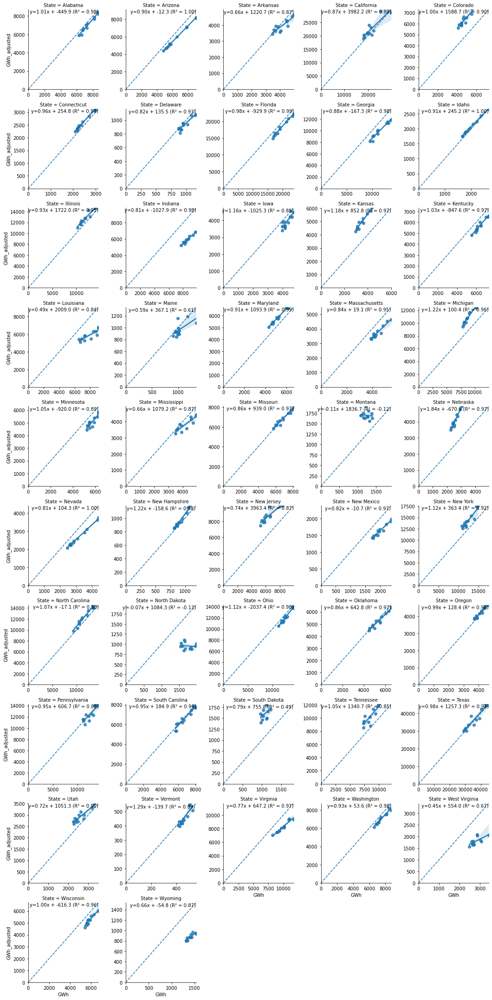

In [33]:
pred = 'GWh_adjusted'
actual = "GWh"


g = sns.FacetGrid(df_check, col="State", col_wrap=5, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

state_list = df_check["State"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["State"]==state_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

In [34]:
state_demand_factors = df_check.groupby("State").mean()
state_demand_factors["factor"] = state_demand_factors["GWh"] / state_demand_factors["GWh_adjusted"]
state_demand_factors = state_demand_factors["factor"].to_dict()
state_demand_factors

df_check["state_GWh_adjusted"] = df_check.apply(lambda x: x["GWh_adjusted"] * state_demand_factors[x["State"]],
                                                axis=1)
df_check

,utc_datetime,State,GWh_allocated,GWh,GWh_adjusted,state_GWh_adjusted
0,201801,Alabama,9301.409715,8571.05263,8372.655155,8770.086719
1,201801,Arizona,5389.587702,5461.68315,4851.432271,5392.188689
2,201801,Arkansas,4704.016139,4485.75249,4234.315677,4425.263917
3,201801,California,23167.884415,20455.04950,20854.549236,19741.061632
4,201801,Colorado,7213.543346,4646.72861,6493.264218,4862.747938
...,...,...,...,...,...,...
559,201812,Virginia,9245.601475,10083.55830,8322.419420,10016.189744
560,201812,Washington,9052.534091,8426.91923,8148.629997,8677.484260
561,201812,West Virginia,2039.916726,3024.45784,1836.229111,2852.805189
562,201812,Wisconsin,5821.228247,5910.84746,5239.973099,5865.901258


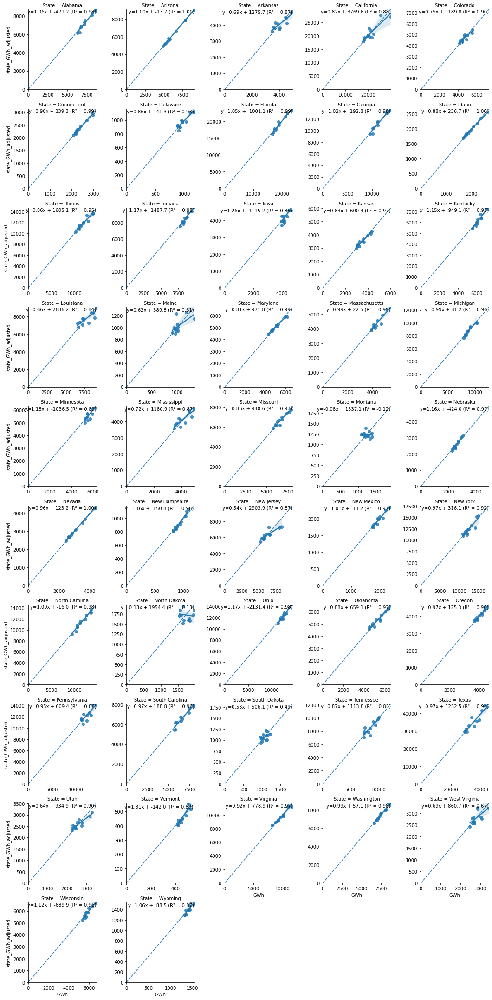

In [35]:
pred = 'state_GWh_adjusted'
actual = "GWh"


g = sns.FacetGrid(df_check, col="State", col_wrap=5, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

state_list = df_check["State"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["State"]==state_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

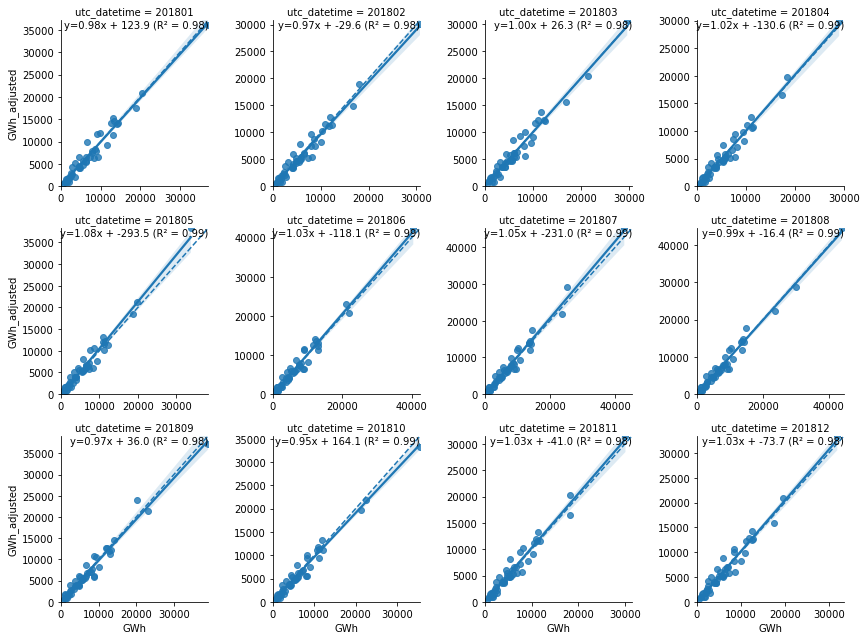

In [36]:
pred = 'GWh_adjusted'
actual = "GWh"

g = sns.FacetGrid(df_check, col="utc_datetime", col_wrap=4, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

time_list = df_check["utc_datetime"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["utc_datetime"]==time_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
      
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

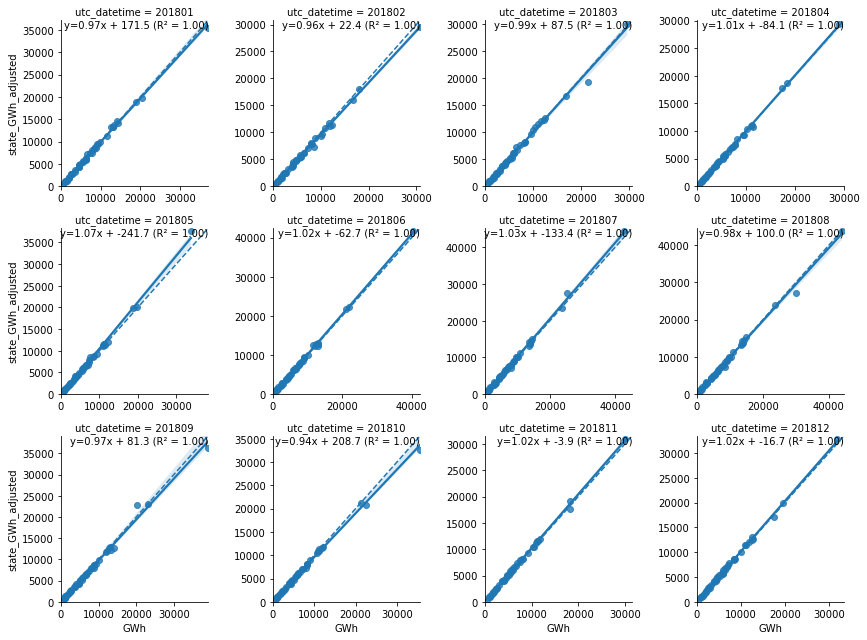

In [37]:
pred = 'state_GWh_adjusted'
actual = "GWh"

g = sns.FacetGrid(df_check, col="utc_datetime", col_wrap=4, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

time_list = df_check["utc_datetime"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["utc_datetime"]==time_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
      
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

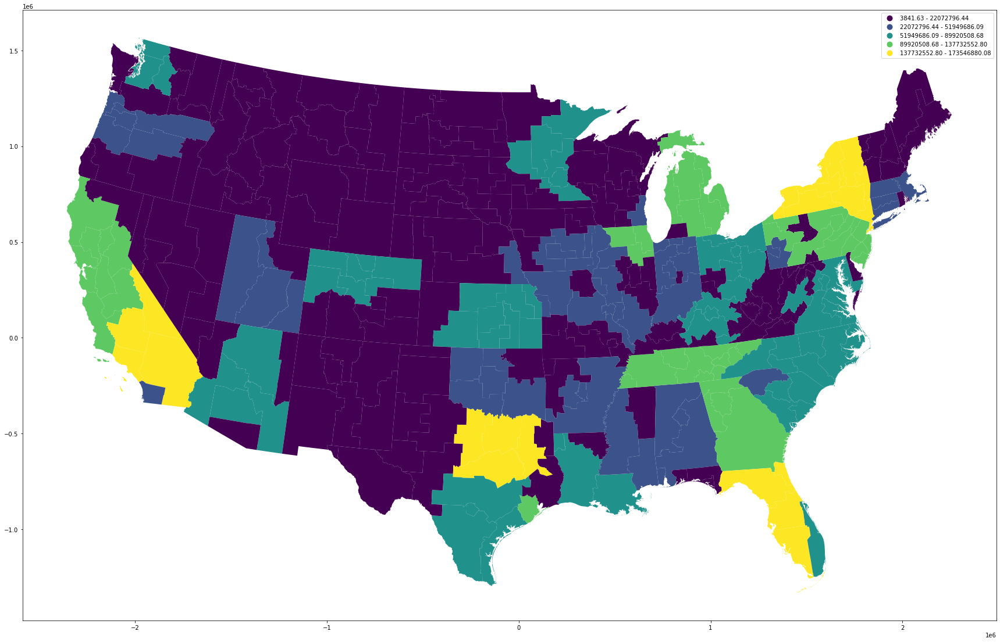

In [38]:
fig, ax = plt.subplots(figsize=(30, 20))
reeds_pca.plot(
    "demand_mwh",
    ax=ax,
    legend=True,
    scheme="NaturalBreaks"
)
plt.show()

In [39]:
ERCOT_SPP_data = pa_demand_2018[
    (pa_demand_2018["utility_id_eia"].isin([17690, 5723])) &
    (pa_demand_2018["utc_datetime"] >= "2018-01-01") &
    (pa_demand_2018["utc_datetime"] < "2019-01-01")]

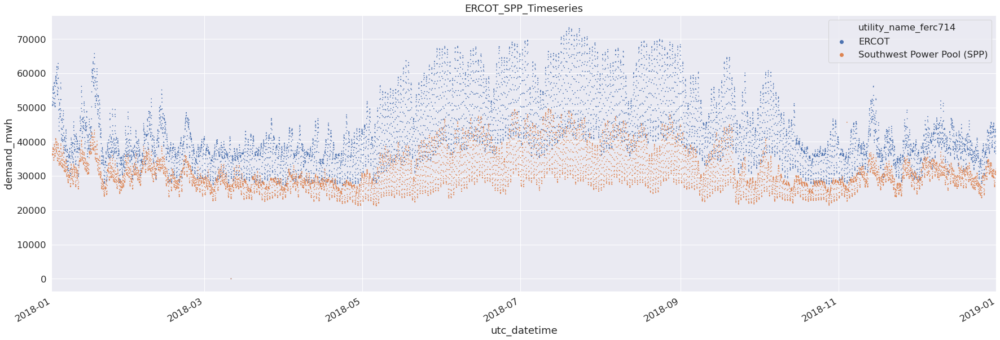

In [40]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

ax = sns.scatterplot(x="utc_datetime", y="demand_mwh", data=ERCOT_SPP_data, s=1, edgecolor=None,
                     hue="utility_name_ferc714")
plt.title("ERCOT_SPP_Timeseries")


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

mpl.rcParams.update(mpl.rcParamsDefault)
plt.show()

## Texas Counties: Harris County (ERCOT) vs Potter County (SPP)

Demand was disaggregated into census tracts, allocated on the basis of population and intersecting planning areas. Then, it can be further reaggregated at different levels, like counties, states, ReEDS areas etc.

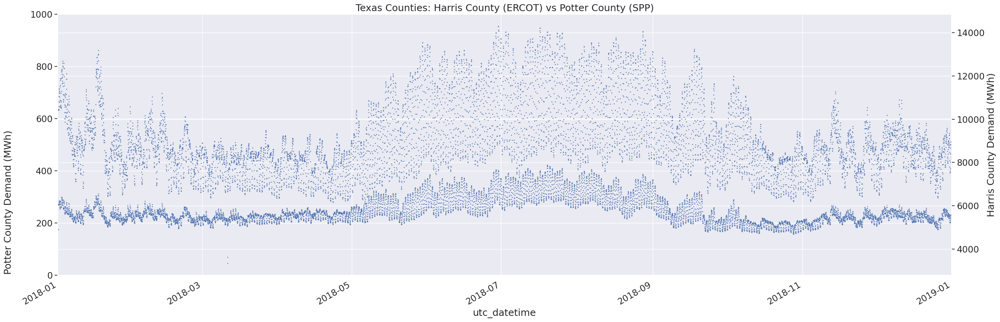

In [41]:
# extract_time_series_demand_multiple_tracts(ferc_df, pop_norm_matrix, )
# Utilities that show up in normalization matrix but not in the time series
missing_utils = set(pop_norm_matrix.columns).difference(set(pa_demand_2018.utility_id_eia))

harris_county_fips = census_tract_gdf[census_tract_gdf["FIPS"].str[:5]=="48201"]["FIPS"].tolist()
harris_county_demand = extract_time_series_demand_multiple_tracts(
    demand_df=pa_demand_2018,
    demand_id_col="utility_id_eia",
    demand_col="demand_mwh",
    time_col="utc_datetime",
    normed_weights=pop_norm_matrix.drop(missing_utils, axis="columns"),
    target_ids=harris_county_fips,
)
harris_county_demand = harris_county_demand.reset_index().rename(columns={0:"demand_mwh"})

potter_county_fips = census_tract_gdf[census_tract_gdf["FIPS"].str[:5]=="48375"]["FIPS"].tolist()
potter_county_demand = extract_time_series_demand_multiple_tracts(
    demand_df=pa_demand_2018,
    demand_id_col="utility_id_eia",
    demand_col="demand_mwh",
    time_col="utc_datetime",
    normed_weights=pop_norm_matrix.drop(missing_utils, axis="columns"),
    target_ids=potter_county_fips,
)
potter_county_demand = potter_county_demand.reset_index().rename(columns={0:"demand_mwh"})

sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

sns.scatterplot(
    x="utc_datetime",
    y="demand_mwh",
    data=potter_county_demand,
    s=1,
    edgecolor=None,
    ax=ax,
    legend=False
)

ax2 = ax.twinx()

sns.scatterplot(
    x="utc_datetime",
    y="demand_mwh",
    data=harris_county_demand,
    s=1,
    edgecolor=None,
    ax=ax2,
    legend=False
)

plt.title("Texas Counties: Harris County (ERCOT) vs Potter County (SPP)")

fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

ax.set_ylim([0, 1000])

ax.set_ylabel("Potter County Demand (MWh)")
ax.yaxis.set_label_coords(-0.05,0.28)
ax2.set_ylabel('Harris County Demand (MWh)')

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

## Time Series of individual PCAs in Texas

In [42]:
pca_texas = ["p" + str(num) for num in [48, 57] + list(range(60, 68, 1))]
pca_id_dict = reeds_gdf.groupby("pca").agg({"OBJECTID": list}).to_dict()["OBJECTID"]
pca_id_texas = {k:v for k, v in pca_id_dict.items() if k in pca_texas}
pca_id_texas

df_reeds_tx = df_reeds_sales[pca_id_texas.keys()][(df_reeds_sales.index >= "2018-01-01") &
                                    (df_reeds_sales.index < "2019-01-01")]

df_reeds_tx_unstack = df_reeds_tx.unstack().reset_index().rename(columns={"level_0": "PCA", 0: "demand_mwh"})

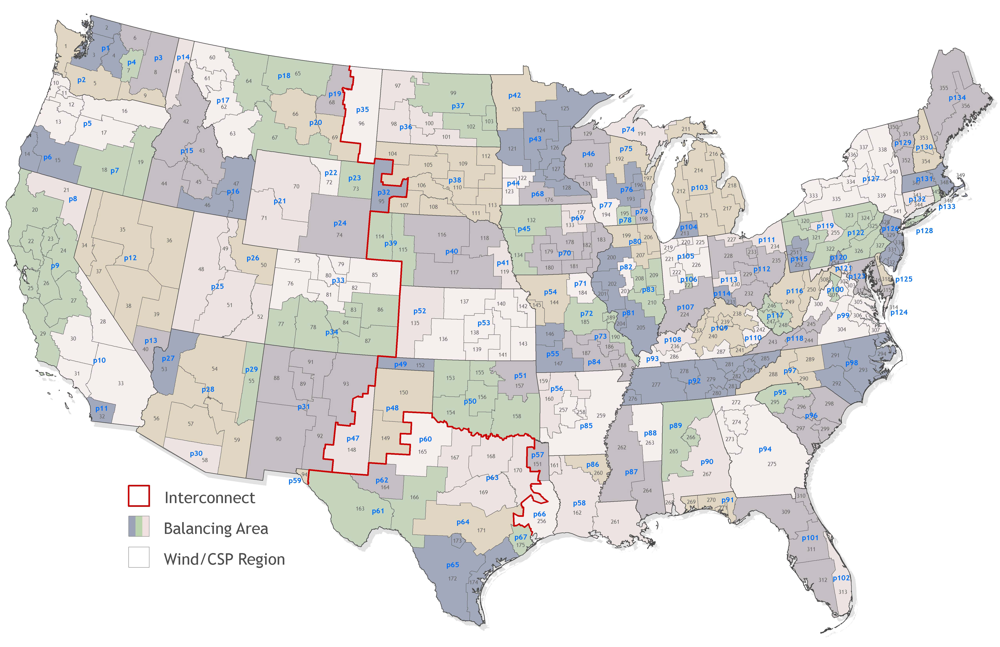

In [43]:
from IPython.display import Image
Image(filename=reeds_path / "reeds_ba_us_11x17.jpg") 

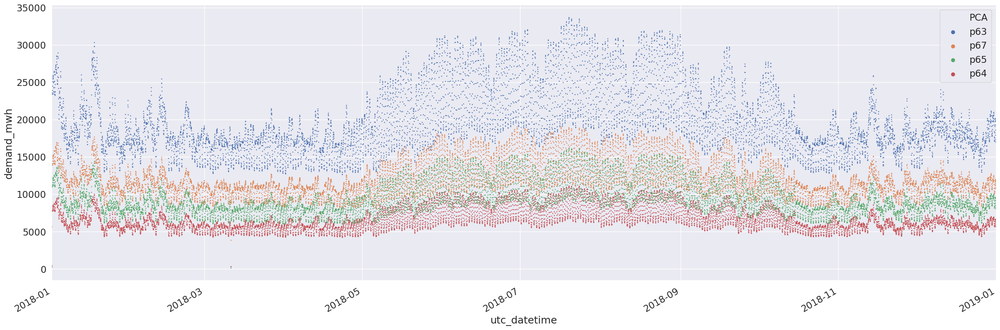

In [44]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.scatterplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     s=1, edgecolor=None, hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

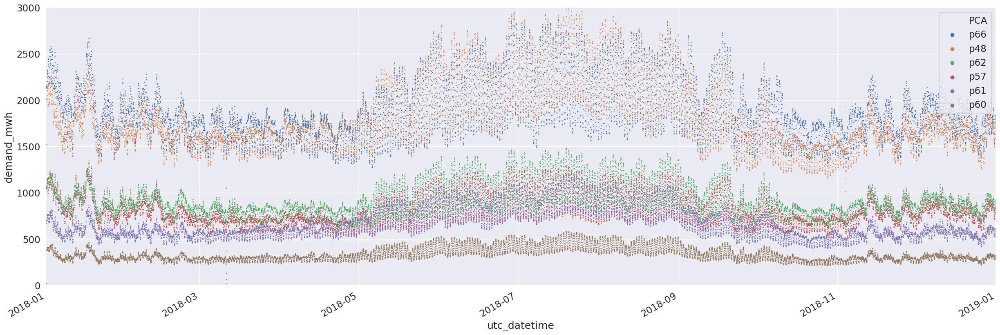

In [45]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.scatterplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     s=1, edgecolor=None, hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])
ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

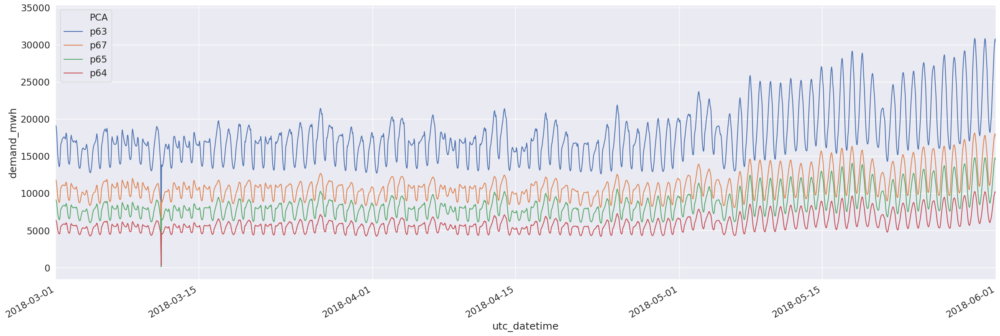

In [46]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 3, 1), datetime.date(2018, 6, 1)])
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

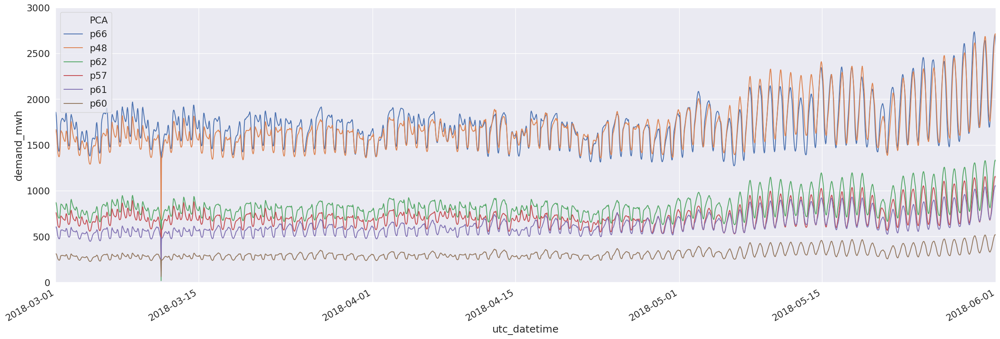

In [47]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 3, 1), datetime.date(2018, 6, 1)])
ax.set_ylim([0, 3000])
plt.legend(loc="upper left")
plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

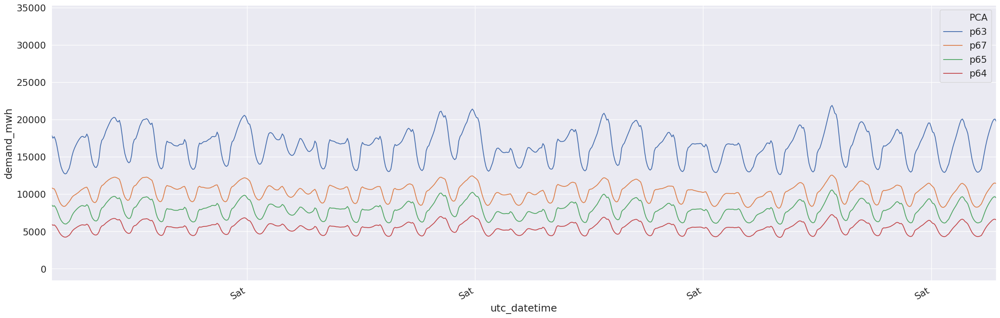

In [48]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 4, 1), datetime.date(2018, 4, 30)])

# Define the date format
date_form = mpl.dates.DateFormatter("%a")
ax.xaxis.set_major_formatter(date_form)

ax.xaxis.set_major_locator(mpl.dates.DayLocator(interval=7))
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

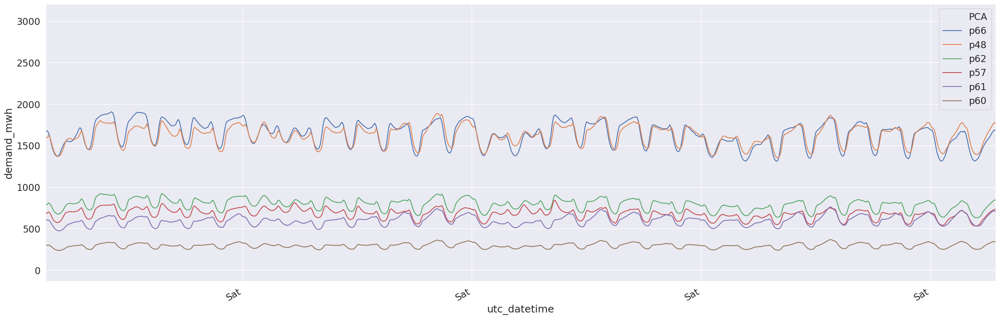

In [49]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 4, 1), datetime.date(2018, 4, 30)])

# Define the date format
date_form = mpl.dates.DateFormatter("%a")
ax.xaxis.set_major_formatter(date_form)

ax.xaxis.set_major_locator(mpl.dates.DayLocator(interval=7))
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)